In [50]:
import h5py
import os
import requests
from pathlib import Path
import healpy as hp
import numpy as np
import cosmoplotian.projections
import cosmoplotian.colormaps
import ligo.skymap.plot
from astropy.coordinates import SkyCoord, Galactic, ICRS
import astropy.units as u
import matplotlib.pyplot as plt
import xarray as xr

In [11]:
root = Path(os.environ["SCRATCH"]) / "h1"
root.mkdir(exist_ok=True)

downloads = [
    ("IQU_integrated_HI4PI_Kkms.fits", 
     "https://dataverse.harvard.edu/api/access/datafile/:persistentId?persistentId=doi:10.7910/DVN/P41KDE/DLAMEB"
    ),
    ("premise_beta.fits",
    None
    ),
    ("premise_temp.fits",
    None
    ),
    ("I_v_HI4PI_Kkms.h5",
     "https://dataverse.harvard.edu/api/access/datafile/:persistentId?persistentId=doi:10.7910/DVN/P41KDE/KT7PV4"
    ),
    ("HI4PI_startvels.npy",
     "https://github.com/seclark/ClarkHensley2019/raw/master/data/HI4PI_startvels.npy"
    ),
    ("HI4PI_stopvels.npy",
     "https://github.com/seclark/ClarkHensley2019/raw/master/data/HI4PI_stopvels.npy"
    ),
]

for fname, url in downloads:
    if url is None:
        continue
    save_path = root / fname
    if save_path.exists():
        print(f"File {save_path} already exists, not downloading.")
        continue
    else:
        print(f"Downloading to {save_path}.")
        req = requests.get(url, stream=True, allow_redirects=True)
        with open(save_path, 'wb') as f:
            for chunk in req.iter_content(8096):
                if chunk:
                    f.write(chunk)

# for convenience store local paths to data files in dictionary
data_paths = {fname: str(root / fname) for fname, _ in downloads}
                            
display(data_paths)

File /global/cscratch1/sd/bthorne/h1/IQU_integrated_HI4PI_Kkms.fits already exists, not downloading.
File /global/cscratch1/sd/bthorne/h1/I_v_HI4PI_Kkms.h5 already exists, not downloading.
File /global/cscratch1/sd/bthorne/h1/HI4PI_startvels.npy already exists, not downloading.
File /global/cscratch1/sd/bthorne/h1/HI4PI_stopvels.npy already exists, not downloading.


{'IQU_integrated_HI4PI_Kkms.fits': '/global/cscratch1/sd/bthorne/h1/IQU_integrated_HI4PI_Kkms.fits',
 'premise_beta.fits': '/global/cscratch1/sd/bthorne/h1/premise_beta.fits',
 'premise_temp.fits': '/global/cscratch1/sd/bthorne/h1/premise_temp.fits',
 'I_v_HI4PI_Kkms.h5': '/global/cscratch1/sd/bthorne/h1/I_v_HI4PI_Kkms.h5',
 'HI4PI_startvels.npy': '/global/cscratch1/sd/bthorne/h1/HI4PI_startvels.npy',
 'HI4PI_stopvels.npy': '/global/cscratch1/sd/bthorne/h1/HI4PI_stopvels.npy'}

In [4]:
def hpix_masked_arr(shape, fill_value=hp.UNSEEN):
    arr = np.ma.masked_all(shape)
    arr.set_fill_value(fill_value)
    return arr

In [13]:
nside_in = 1024
nside_out = 64

npix_in = hp.nside2npix(nside_in)
npix_out = hp.nside2npix(nside_out)

gal_lat_a = 0
gal_lat_b = 20.

n_channels = 41
I_v_HI4PI_ma_in = hpix_masked_arr((npix_in, n_channels))
I_v_HI4PI_ma_out = hpix_masked_arr((npix_out, n_channels))

In [17]:
nu_startvels = np.load(data_paths["HI4PI_startvels.npy"])
nu_stopvels = np.load(data_paths["HI4PI_stopvels.npy"])
native_width = 1.28825 # native HI4PI channel width in km/s
chan_widths = nu_stopvels - nu_startvels + native_width # velocity widths of nonuniformly binned channels
chan_centers = nu_startvels + chan_widths/2.

## Read data

In [18]:
# HEALPix pixels to read from array (assumed saved array in RING ordering)
query = hp.query_strip(nside_in, np.radians(gal_lat_a), np.radians(gal_lat_b))

with h5py.File(data_paths['I_v_HI4PI_Kkms.h5'], 'r') as f:
    for i in range(n_channels):
        I_v_HI4PI_ma_in[query, i] = f['IHI_v'][query, i]
        I_v_HI4PI_ma_out[:, i] = hp.ud_grade(I_v_HI4PI_ma_in[:, i], nside_out=nside_out)

KeyboardInterrupt: 

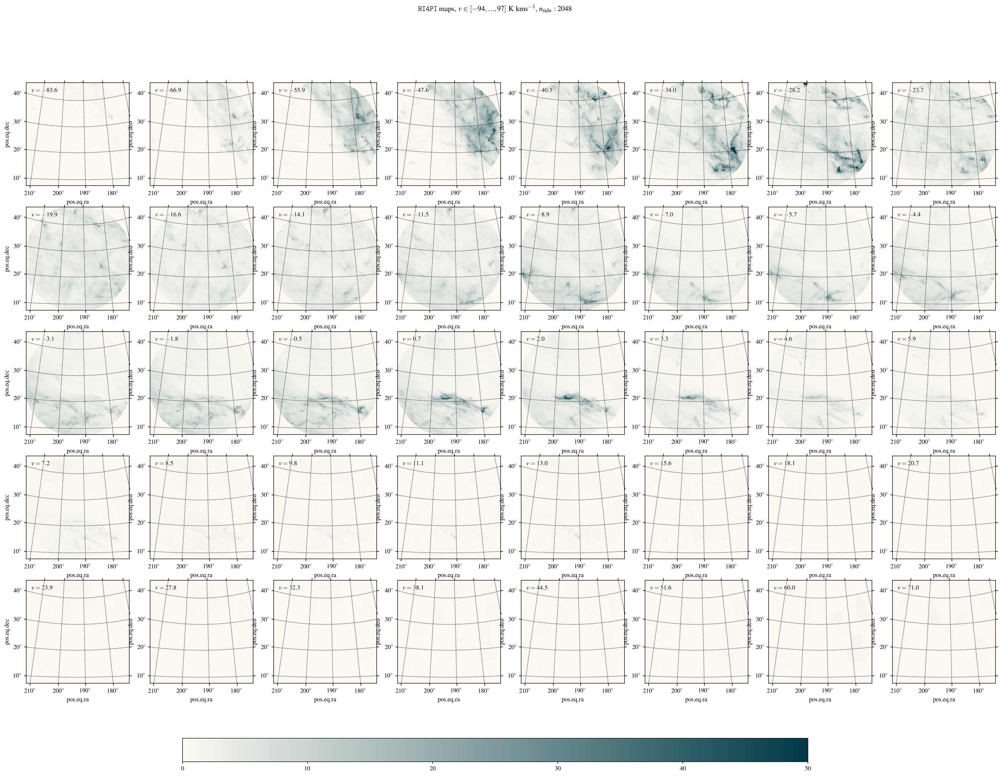

In [47]:
center = SkyCoord(l=0. * u.deg, b=90. * u.deg, frame=Galactic()).icrs
radius = 20. * u.deg

plt.style.use('default')
plt.rcParams['text.usetex'] = True

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times', 'Palatino', 'New Century Schoolbook', 'Bookman', 'Computer Modern Roman']

subplot_kw = {
    'projection': 'astro degrees zoom',
    'center': center,
    'radius': radius,
}

ncols = 8
nrows = 5

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*3.5, nrows*3.5), dpi=150, subplot_kw=subplot_kw)
fig.suptitle(r"${\tt HI4PI}$ maps, $v \in [-94, ..., 97]~{\rm K~kms^{-1}}$, $n_{\rm side}: 2048$", horizontalalignment='center')

for i in range(min(ncols * nrows, 41)):
    ax = axes.flatten()[i]
    ax.grid(linestyle='--', linewidth=0.5, color='k')
    img = ax.imshow_hpx((I_v_HI4PI_ma_in[:, i], Galactic()), cmap='lin blu', vmin=0, vmax=50)
    img.cmap.set_bad('k', alpha=0.5)
    ax.annotate(f"$v={{{chan_centers[i]:.01f}}}$", xy=(0.05, 0.91), xycoords='axes fraction', fontsize=10)
    ligo.skymap.plot.outline_text(ax)
    
cbaxes = fig.add_axes([0.25, 0.01, 0.5, 0.03]) 
cb = plt.colorbar(img, orientation='horizontal', cax=cbaxes)
cb.ax.xaxis.set_ticks_position('bottom')
#cb.ax.xaxis.set_ticks([0, 10, 20, 30, 40, 50])
fig.savefig("/global/u1/b/bthorne/projects/chivos/plots/IHI_v_nside_2048._lb_00-90._range_0-5.png", bbox_inches='tight')

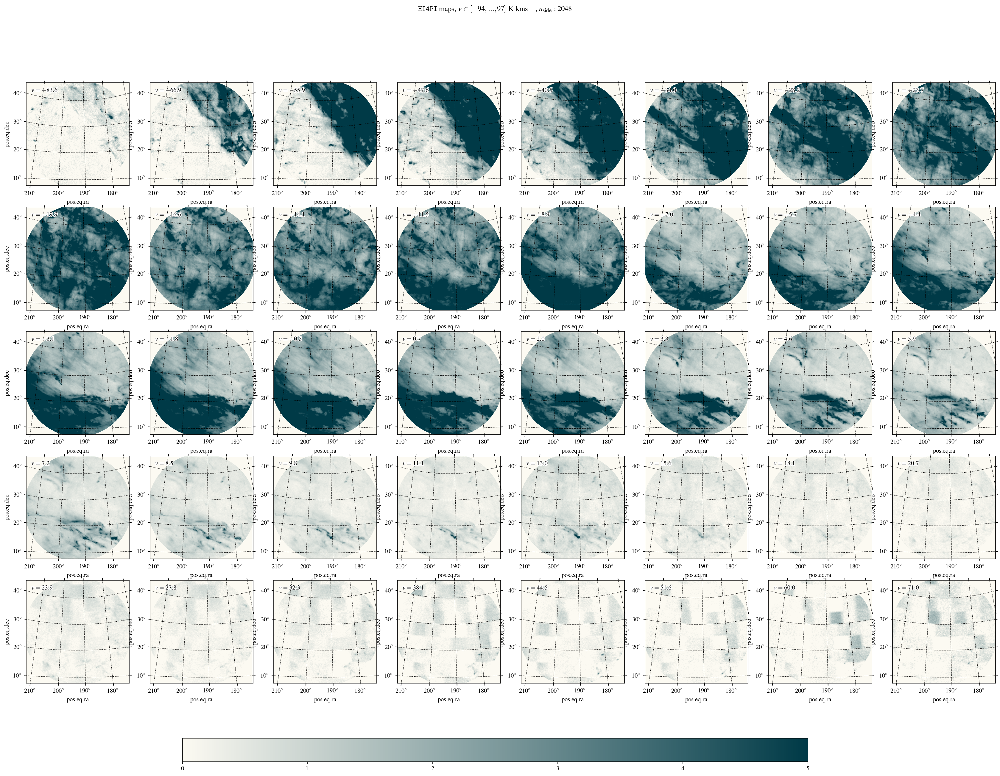

In [46]:
center = SkyCoord(l=0. * u.deg, b=90. * u.deg, frame=Galactic()).icrs
radius = 20. * u.deg

plt.style.use('default')
plt.rcParams['text.usetex'] = True

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times', 'Palatino', 'New Century Schoolbook', 'Bookman', 'Computer Modern Roman']

subplot_kw = {
    'projection': 'astro degrees zoom',
    'center': center,
    'radius': radius,
}

ncols = 8
nrows = 5

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*3.5, nrows*3.5), dpi=150, subplot_kw=subplot_kw)
fig.suptitle(r"${\tt HI4PI}$ maps, $v \in [-94, ..., 97]~{\rm K~kms^{-1}}$, $n_{\rm side}: 2048$", horizontalalignment='center')

for i in range(min(ncols * nrows, 41)):
    ax = axes.flatten()[i]
    ax.grid(linestyle='--', linewidth=0.5, color='k')
    img = ax.imshow_hpx((I_v_HI4PI_ma_in[:, i], Galactic()), cmap='lin blu', vmin=0, vmax=5)
    img.cmap.set_bad('k', alpha=0.5)
    ax.annotate(f"$v={{{chan_centers[i]:.01f}}}$", xy=(0.05, 0.91), xycoords='axes fraction', fontsize=10)
    ligo.skymap.plot.outline_text(ax)
    
cbaxes = fig.add_axes([0.25, 0.01, 0.5, 0.03]) 
cb = plt.colorbar(img, orientation='horizontal', cax=cbaxes)
cb.ax.xaxis.set_ticks_position('bottom')
#cb.ax.xaxis.set_ticks([0, 10, 20, 30, 40, 50])
fig.savefig("/global/u1/b/bthorne/projects/chivos/plots/IHI_v_nside_2048._lb_00-90._range_0-5.png", bbox_inches='tight')

In [51]:
dims = ['healpix_index', 'channel_center']
coords = {
    'healpix_index': np.arange(npix_in),
    'channel_center': chan_centers 
}
dset = xr.Dataset(
    {
        'IHI_v': (dims, I_v_HI4PI_ma_in.filled(hp.UNSEEN))
    },
    coords=coords
)

In [57]:
dset.to_netcdf(str(root / f"IHI_v_nside_{nside_in}.cdf"))

In [55]:
dims = ['healpix_index', 'channel_center']
coords = {
    'healpix_index': np.arange(npix_out),
    'channel_center': chan_centers 
}
dset = xr.Dataset(
    {
        'IHI_v': (dims, I_v_HI4PI_ma_out.filled(hp.UNSEEN))
    },
    coords=coords
)

In [58]:
dset.to_netcdf(str(root / f"IHI_v_nside_{nside_out:04d}.cdf"))